# Advertiser_SalesModel_MCMC:
---

predict:
site visit
schedule visit

In [2]:
import os
import us
import math
import mpld3
import pickle
import cycler
import theano
import tabulate
import warnings
import sqlalchemy
import numpy as np
import pymc3 as pm
import pandas as pd
import scipy.fftpack
import statsmodels.api
import theano.tensor as tt
import patsy, patsy.contrasts
import seaborn.apionly as sns
import matplotlib as mpl, matplotlib.pyplot as plt
import cachetools
warnings.filterwarnings('ignore')
pd.set_option('display.expand_frame_repr', True)
pd.set_option('display.max_columns', 300)
pd.set_option('display.max_categories', 300)
pd.set_option('display.width', 208)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.memory_usage', True)
pd.set_option('display.precision', 7)
plt.style.use(['classic'])
plt.rcParams['font.family'] = 'serif'
%matplotlib inline

---
## Configuration:
---

In [3]:
categorical_encoding = None
master_hdf = 'data/Advertiser_master_dataframe.hdf'

In [4]:
def round_to_n(aval, n):
    bval = aval
    if aval == 0:
        return 0
    if aval < 0:
        bval = -aval
    rval = round(bval, -int(math.floor(math.log10(bval))) + (n - 1))
    if aval < 0:
        rval = -rval
    return rval

---
## Data Sources:
---

In [5]:
with pd.HDFStore(master_hdf) as hdf:
    print(hdf.keys())

['/badcrash_buzz', '/city_sales', '/crash_buzz', '/digi_acts', '/digi_acts_bystate', '/digi_acts_bystate_flat', '/digi_acts_flat', '/digi_acts_raw', '/digi_imps', '/digi_imps_bystate', '/digi_imps_cats', '/digi_imps_cats_bystate', '/digi_imps_cats_bystate_flat', '/digi_imps_cats_flat', '/digi_imps_flat', '/djta', '/fuel', '/fuel_bystate', '/ga', '/ga_bystate', '/gtrends', '/gtrends_bystate', '/merged', '/merged_acts', '/merged_noacts', '/merged_state', '/merged_state_noacts', '/offline', '/sales', '/search_acts', '/search_acts_flat', '/search_imps', '/search_imps_flat', '/social_buzz', '/social_buzz_bystate', '/state_sales', '/yougov']


In [12]:
city_sales = pd.read_hdf(master_hdf, 'city_sales')
state_sales = pd.read_hdf(master_hdf, 'state_sales')
sales = pd.read_hdf(master_hdf, 'sales')
merged = pd.read_hdf(master_hdf, 'merged')
merged_acts = pd.read_hdf(master_hdf, 'merged_acts')
merged_noacts = pd.read_hdf(master_hdf, 'merged_noacts')
merged_state_noacts = pd.read_hdf(master_hdf, 'merged_noacts');

In [13]:
merged_noacts.columns = merged_noacts.columns.str.replace('digicat_','digital_').str.replace('revenue','digital_revenue')
merged_acts.columns = merged_acts.columns.str.replace('digicat_','digital_')

In [14]:
drop_list = merged_noacts.astype(bool).sum().where(lambda x: x < 90).dropna().index.values
drop_list = np.append(drop_list, ['crash_buzz','badcrash_buzz','transactions','search_cost','search_branded_cost'])
print(drop_list)
merged_noacts.drop(drop_list, axis = 1, inplace = True)

['digital_influencers' 'digital_native' 'digital_social_ads'
 'digital_social_video' 'crash_buzz' 'badcrash_buzz' 'transactions'
 'search_cost' 'search_branded_cost']


---
## Bare bones fit:
---

In [15]:
num_samples = 30000

In [18]:
sales_avg = merged_noacts.sales.mean()
modelstr = 'sales ~ fuel_price + gtrend + search_clicks + newusers + search_branded_impressions'
modelstr += ' + digital_pricing_non_riders_retargeting + digital_revenue + digital_promo_non_riders_prospecting'
modelstr += ' + digital_brand_non_riders + digital_brand_non_riders_retargeting'
glm = pm.Model()
with glm:
    pm.glm.glm(modelstr, merged_noacts,
               intercept_prior = pm.distributions.Gamma.dist(mu = sales_avg, sd = 100),
               regressor_prior = pm.distributions.Gamma.dist(mu = 10, sd = 1000),
               family = pm.glm.families.StudentT())
    step = pm.step_methods.Metropolis()
    #step = pm.NUTS(state = pm.find_MAP())
    merged_noacts_trace = pm.sample(num_samples, step, progressbar = True)

Applied log-transform to Intercept and added transformed Intercept_log_ to model.
Applied log-transform to fuel_price and added transformed fuel_price_log_ to model.
Applied log-transform to gtrend and added transformed gtrend_log_ to model.
Applied log-transform to search_clicks and added transformed search_clicks_log_ to model.
Applied log-transform to newusers and added transformed newusers_log_ to model.
Applied log-transform to search_branded_impressions and added transformed search_branded_impressions_log_ to model.
Applied log-transform to digital_pricing_non_riders_retargeting and added transformed digital_pricing_non_riders_retargeting_log_ to model.
Applied log-transform to digital_revenue and added transformed digital_revenue_log_ to model.
Applied log-transform to digital_promo_non_riders_prospecting and added transformed digital_promo_non_riders_prospecting_log_ to model.
Applied log-transform to digital_brand_non_riders and added transformed digital_brand_non_riders_log_ 

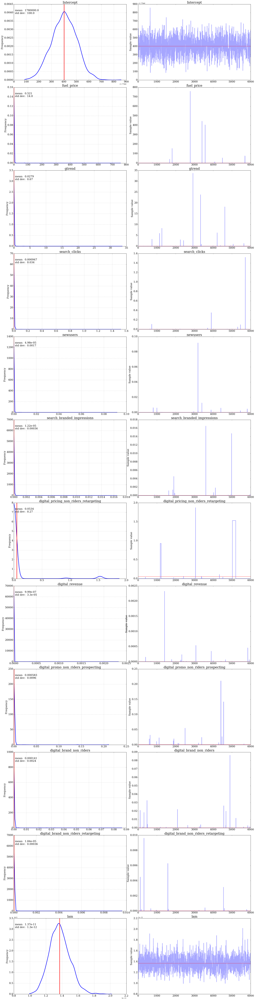

In [19]:
throwaway = int(0.8 * num_samples)
with glm:
    summary = pm.df_summary(merged_noacts_trace[throwaway:])
    mean_dict = {k: v['mean'] for k, v in summary.iterrows()}
    err_dict = {k: v['sd'] for k, v in summary.iterrows()}
    axes = pm.traceplot(merged_noacts_trace[throwaway:], figsize = (24, len(merged_noacts_trace.varnames)*4), lines = mean_dict, grid = True);
    for ax2 in axes:
        for chart_num, ax in enumerate(ax2):
            varkey = ax.title.get_text()
            if chart_num == 0:
                cmu = round_to_n(mean_dict[varkey], 3)
                csd = round_to_n(err_dict[varkey], 2)
                ax.text(0.01, 0.9, 'mean:  %s\nstd dev:  %s' % (cmu, csd), fontsize = 18, horizontalalignment='left', verticalalignment = 'center', transform = ax.transAxes)
            ax.title.set_fontsize(22)
            for item in ax.get_lines():
                item.set_linewidth(3)
            for item in ([ax.xaxis.label, ax.yaxis.label] + ax.get_yticklabels()):
                item.set_fontsize(18)
            for item in ax.get_xticklabels():
                item.set_fontsize(18)

In [21]:
print(sales_avg)
vardat = []
throwaway = int(0.8 * num_samples)
for varname in merged_noacts_trace.varnames:
    vardat += [[varname, float(merged_noacts_trace.get_values(varname)[throwaway:].mean()), float(np.sqrt(merged_noacts_trace.get_values(varname)[throwaway:].var()))]]
merged_noacts_fit = pd.DataFrame(vardat, columns = ['varname', 'beta', 'std_err']).sort_values('beta', ascending = False)
merged_noacts_params = merged_noacts_fit.copy()#.query('beta > 0 and 0.8 * abs(beta) > std_err')
merged_noacts_params.std_err = (merged_noacts_params.std_err/ merged_noacts_params.beta).apply(lambda x: str(round(100*x,0))+'%')
merged_noacts_params = merged_noacts_params[~merged_noacts_params.varname.str.contains('_log|lam')]
merged_noacts_params = merged_noacts_params.reset_index(drop = True).style.background_gradient(subset = 'beta', cmap = 'coolwarm', low = 0.9)
merged_noacts_params

1779410.9432684302


---
## GLM MCMC MERGED_NOACTS:
---

In [124]:
num_samples = 100000

In [125]:
sales_avg = merged_noacts.sales.mean()
modelstr = 'sales ~ ' + ' + '.join(merged_noacts.columns[3:])
glm = pm.Model()
with glm:
    pm.glm.glm(modelstr, merged_noacts,
               intercept_prior = pm.distributions.Gamma.dist(mu = sales_avg, sd = 100),
               #regressor_prior = pm.distributions.Gamma.dist(mu = 10, sd = 1000),
               family = pm.glm.families.StudentT())
    step = pm.step_methods.Metropolis()
    #step = pm.NUTS(state = pm.find_MAP())
    merged_noacts_trace = pm.sample(num_samples, step, progressbar = True)

Applied log-transform to Intercept and added transformed Intercept_log_ to model.
Applied log-transform to lam and added transformed lam_log_ to model.
100%|██████████| 100000/100000 [19:44<00:00, 84.44it/s]


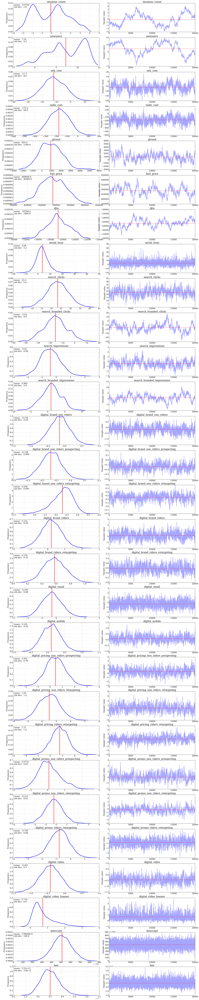

In [126]:
throwaway = int(0.8 * num_samples)
with glm:
    summary = pm.df_summary(merged_noacts_trace[throwaway:])
    mean_dict = {k: v['mean'] for k, v in summary.iterrows()}
    err_dict = {k: v['sd'] for k, v in summary.iterrows()}
    axes = pm.traceplot(merged_noacts_trace[throwaway:], figsize = (24, len(merged_noacts_trace.varnames)*4), lines = mean_dict, grid = True);
    for ax2 in axes:
        for chart_num, ax in enumerate(ax2):
            varkey = ax.title.get_text()
            if chart_num == 0:
                cmu = round_to_n(mean_dict[varkey], 3)
                csd = round_to_n(err_dict[varkey], 2)
                ax.text(0.01, 0.9, 'mean:  %s\nstd dev:  %s' % (cmu, csd), fontsize = 18, horizontalalignment='left', verticalalignment = 'center', transform = ax.transAxes)
            ax.title.set_fontsize(22)
            for item in ax.get_lines():
                item.set_linewidth(3)
            for item in ([ax.xaxis.label, ax.yaxis.label] + ax.get_yticklabels()):
                item.set_fontsize(18)
            for item in ax.get_xticklabels():
                item.set_fontsize(18)

In [128]:
print(sales_avg)
vardat = []
throwaway = int(0.8 * num_samples)
for varname in merged_noacts_trace.varnames:
    vardat += [[varname, float(merged_noacts_trace.get_values(varname)[throwaway:].mean()), float(np.sqrt(merged_noacts_trace.get_values(varname)[throwaway:].var()))]]
merged_noacts_fit = pd.DataFrame(vardat, columns = ['varname', 'beta', 'std_err']).sort_values('beta', ascending = False)
merged_noacts_params = merged_noacts_fit.query('beta > 0 and 0.8 * abs(beta) > std_err')
merged_noacts_params.std_err = (merged_noacts_params.std_err/ merged_noacts_params.beta).apply(lambda x: str(round(100*x,0))+'%')
merged_noacts_params = merged_noacts_params[~merged_noacts_params.varname.str.contains('_log|lam')]
merged_noacts_params = merged_noacts_params.reset_index(drop = True).style.background_gradient(subset = 'beta', cmap = 'coolwarm', low = 0.9)
merged_noacts_params

1779410.9432684302


---
## GLM MCMC MERGED_ACTS:
---

In [34]:
modelstr = 'sales ~ ' + ' + '.join(merged_acts.columns[3:])
glm2 = pm.Model()
with glm2:
    pm.glm.glm(modelstr, merged_acts,
               intercept_prior = pm.distributions.Gamma.dist(mu = sales_avg, sd = 100),
               #regressor_prior = pm.distributions.Gamma.dist(mu = 10, sd = 1000),
               family = pm.glm.families.StudentT())
    step = pm.step_methods.Metropolis()
    merged_acts_trace = pm.sample(num_samples, step, progressbar = True)

Applied log-transform to Intercept and added transformed Intercept_log_ to model.
Applied log-transform to lam and added transformed lam_log_ to model.
100%|██████████| 100000/100000 [32:52<00:00, 50.71it/s]


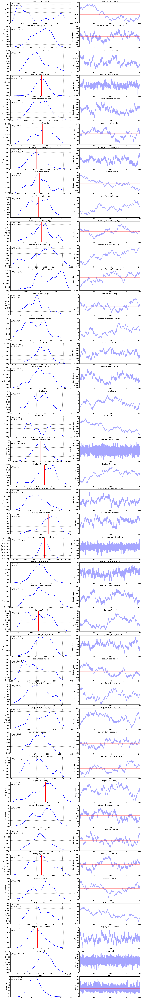

In [105]:
throwaway = int(0.8 * num_samples)
with glm2:
    summary = pm.df_summary(merged_acts_trace[throwaway:])
    mean_dict = {k: v['mean'] for k, v in summary.iterrows()}
    err_dict = {k: v['sd'] for k, v in summary.iterrows()}
    axes = pm.traceplot(merged_acts_trace[throwaway:], figsize = (24, len(merged_acts_trace.varnames)*4), lines = mean_dict, grid = True);
    for ax2 in axes:
        for chart_num, ax in enumerate(ax2):
            varkey = ax.title.get_text()
            if chart_num == 0:
                cmu = round_to_n(mean_dict[varkey], 3)
                csd = round_to_n(err_dict[varkey], 2)
                ax.text(0.01, 0.9, 'mean:  %s\nstd dev:  %s' % (cmu, csd), fontsize = 18, horizontalalignment='left', verticalalignment = 'center', transform = ax.transAxes)
            ax.title.set_fontsize(22)
            for item in ax.get_lines():
                item.set_linewidth(3)
            for item in ([ax.xaxis.label, ax.yaxis.label] + ax.get_yticklabels()):
                item.set_fontsize(18)
            for item in ax.get_xticklabels():
                item.set_fontsize(18)

In [106]:
print(sales_avg)
vardat = []
throwaway = int(0.8*num_samples)
for varname in merged_acts_trace.varnames:
    vardat += [[varname, float(merged_acts_trace.get_values(varname)[throwaway:].mean()), float(np.sqrt(merged_acts_trace.get_values(varname)[throwaway:].var()))]]
merged_acts_fit = pd.DataFrame(vardat, columns = ['varname', 'beta', 'std_err']).sort_values('beta', ascending = False)
merged_acts_params = merged_acts_fit.query('beta > 0 and 0.8 * abs(beta) > std_err')
merged_acts_params.std_err = (merged_acts_params.std_err/ merged_acts_params.beta).apply(lambda x: str(round(100*x,0))+'%')
merged_acts_params = merged_acts_params[~merged_acts_params.varname.str.contains('_log|lam')]
merged_acts_params = merged_acts_params.reset_index(drop = True).style.background_gradient(subset = 'beta', cmap = 'coolwarm', low = 0.9)
merged_acts_params

1779410.9432684302


---
## Fit on Shorter Timeframe:
---

## MCMC NOACTS 2016:
---

In [12]:
modelstr = 'sales ~ ' + ' + '.join(merged_noacts.columns[3:])
glm2016 = pm.Model()
with glm2016:
    pm.glm.glm(modelstr, merged_noacts['2016-01-01':], family = pm.glm.families.StudentT())
    step = pm.Metropolis()
    merged2016_noacts_trace = pm.sample(20000, step, progressbar = True)

Applied log-transform to lam and added transformed lam_log_ to model.
100%|██████████| 20000/20000 [04:01<00:00, 82.68it/s] 


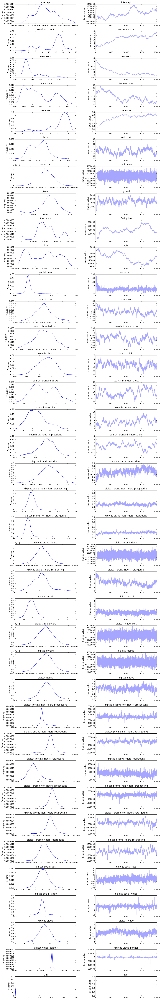

In [13]:
plt.figure(figsize=(32, 20))
pm.traceplot(merged2016_noacts_trace)
plt.tight_layout();

In [23]:
vardat = []
throwaway = 10000
for varname in merged2016_noacts_trace.varnames:
    vardat += [[varname, float(merged2016_noacts_trace.get_values(varname)[throwaway:].mean()), float(np.sqrt(merged2016_noacts_trace.get_values(varname)[throwaway:].var()))]]
merged2016_noacts_fit = pd.DataFrame(vardat, columns = ['varname', 'beta', 'std_err']).sort_values('beta', ascending = False)
merged2016_noacts_params = merged2016_noacts_fit.query('beta > -10000 and 0.9 * abs(beta) > std_err')
merged2016_noacts_params = merged2016_noacts_params[~merged2016_noacts_params.varname.str.contains('djta|sd_log_|Intercept|sd|lam|lam_log_')]
merged2016_noacts_params = merged2016_noacts_params.reset_index(drop = True).style.background_gradient(subset = 'beta', cmap = 'coolwarm', low = 0.9)
merged2016_noacts_params

## MCMC ACTS 2016:
---

In [15]:
modelstr = 'sales ~ ' + ' + '.join(merged_acts.columns[3:])
glm2016acts = pm.Model()
with glm2016acts:
    pm.glm.glm(modelstr, merged_acts['2016-01-01':], family = pm.glm.families.StudentT())
    step = pm.Metropolis()
    merged2016_acts_trace = pm.sample(20000, step, progressbar = True)

Applied log-transform to lam and added transformed lam_log_ to model.
100%|██████████| 20000/20000 [05:02<00:00, 66.15it/s]


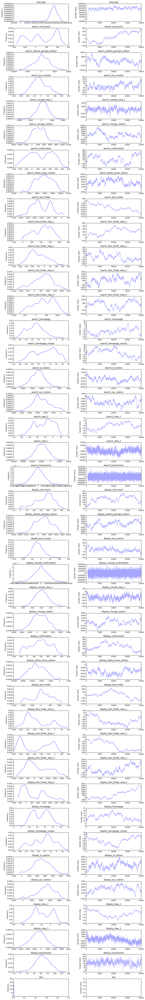

In [16]:
plt.figure(figsize=(32, 20))
pm.traceplot(merged2016_acts_trace)
plt.tight_layout();

In [18]:
vardat = []
throwaway = 10000
for varname in merged2016_acts_trace.varnames:
    vardat += [[varname, float(merged2016_acts_trace.get_values(varname)[throwaway:].mean()), float(np.sqrt(merged2016_acts_trace.get_values(varname)[throwaway:].var()))]]
merged2016_acts_fit = pd.DataFrame(vardat, columns = ['varname', 'beta', 'std_err']).sort_values('beta', ascending = False)
merged2016_acts_params = merged2016_acts_fit.query('beta > 0 and 0.9 * abs(beta) > std_err and varname != "sd_log_" and varname != "Intercept" and varname != "sd" and varname != "lam"')
merged2016_acts_params = merged2016_acts_params.reset_index(drop = True).style.background_gradient(subset = 'beta', cmap = 'coolwarm', low = 0.9)
merged2016_acts_params

In [15]:
merged_noacts.head(2)

,sales,tickets,miles,sessions_count,newusers,transactions,revenue,ooh_cost,radio_cost,gtrend,fuel_price,djta,social_buzz,search_cost,search_branded_cost,search_clicks,search_branded_clicks,search_impressions,search_branded_impressions,digicat_brand_non_riders,digicat_brand_non_riders_prospecting,digicat_brand_non_riders_retargeting,digicat_brand_riders,digicat_brand_riders_retargeting,digicat_email,digicat_influencers,digicat_mobile,digicat_native,digicat_pricing_non_riders_prospecting,digicat_pricing_non_riders_retargeting,digicat_pricing_riders_retargeting,digicat_promo_non_riders_prospecting,digicat_promo_non_riders_retargeting,digicat_promo_riders_retargeting,digicat_social_ads,digicat_social_video,digicat_video,digicat_video_banner
datebin,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-01-01,1691411.48,32920.0,12512018.0,137868.0,71264.0,7003.0,517235.0,1992.1371705,0.0,66.2829332,2.2599692,75.3394993,466.0,1256.89,593.86,6683.0,8896.0,99206.0,31685.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-01-02,2415880.02,42562.0,14176550.0,163713.0,83484.0,9087.0,717627.0,1992.1371705,0.0,69.8703824,2.2462073,75.1689990,510.0,1310.38,593.15,7217.0,9361.0,111389.0,33156.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


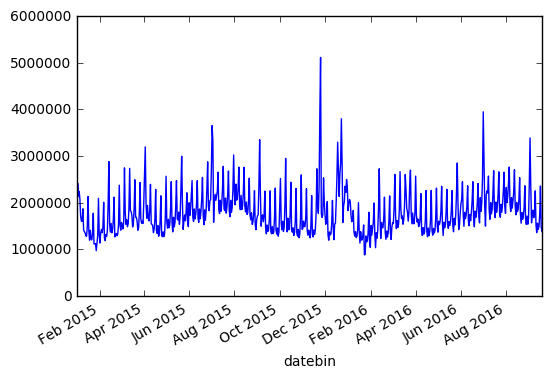

In [31]:
merged_noacts.sales.plot()

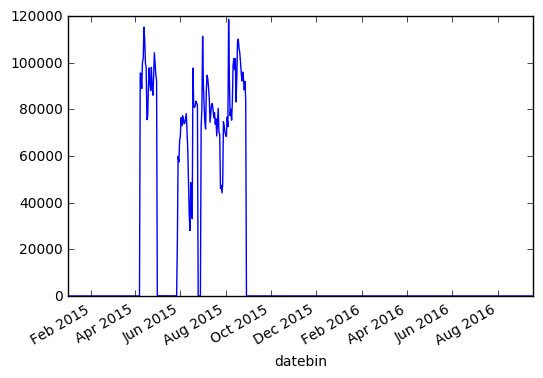

In [34]:
merged_noacts.digicat_pricing_non_riders_prospecting.plot()

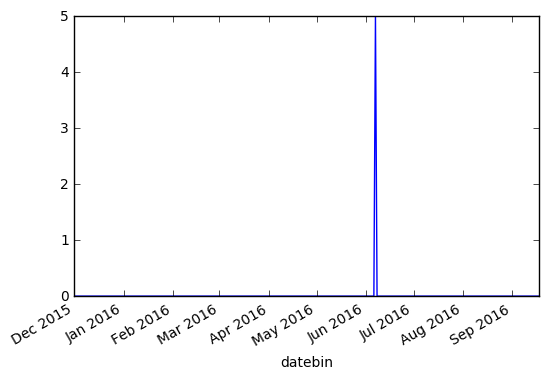

In [28]:
merged_noacts['2015-12-01':].digicat_promo_riders_retargeting.plot()

In [25]:
merged_noacts.digicat_promo_riders_retargeting.astype(bool).sum() / merged_noacts.digicat_promo_riders_retargeting.count()

0.31710709318497915

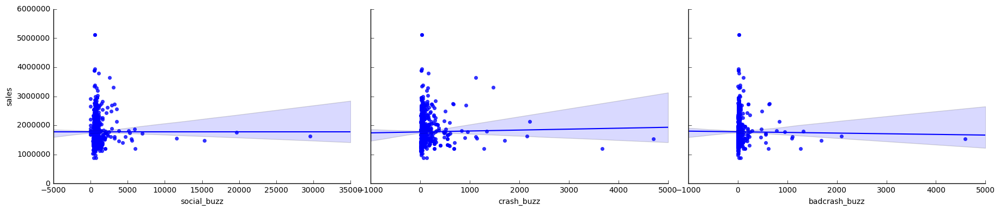

In [43]:
g = sns.PairGrid(merged_noacts, y_vars = ['sales'], x_vars = [x for x in list(merged_noacts.columns[3:]) if 'buzz' in x], size = 4, aspect = 1.5)
g.map(sns.regplot)

In [40]:
def qqplot(x, y, **kwargs):
    _, xr = scipy.stats.probplot(x, fit=False)
    _, yr = scipy.stats.probplot(y, fit=False)
    plt.scatter(xr, yr, **kwargs)

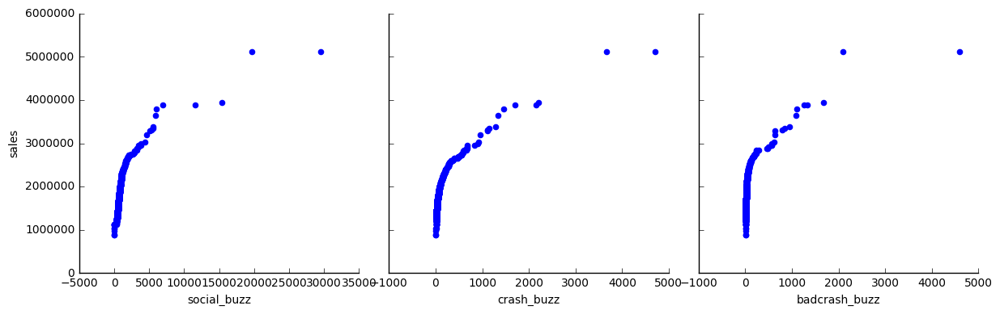

In [45]:
g = sns.PairGrid(merged_noacts, y_vars = ['sales'], x_vars = [x for x in list(merged_noacts.columns[3:]) if 'buzz' in x], size = 4)
g.map(qqplot)

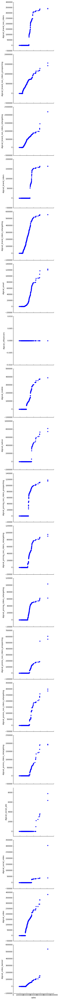

In [48]:
g = sns.PairGrid(merged_noacts, x_vars = ['sales'], y_vars = [x for x in list(merged_noacts.columns[3:]) if 'digicat' in x], size = 4)
g.map(qqplot)

In [59]:
import sklearn.manifold
tsne2 = sklearn.manifold.TSNE(n_components = 2, random_state = 777)
tsne3 = sklearn.manifold.TSNE(n_components = 3, random_state = 777)
np.set_printoptions(suppress = True)
tsne2_fit = tsne2.fit_transform(merged_noacts)
tsne3_fit = tsne3.fit_transform(merged_noacts)
print(tsne2_fit.shape, tsne3_fit.shape)

(719, 2) (719, 3)


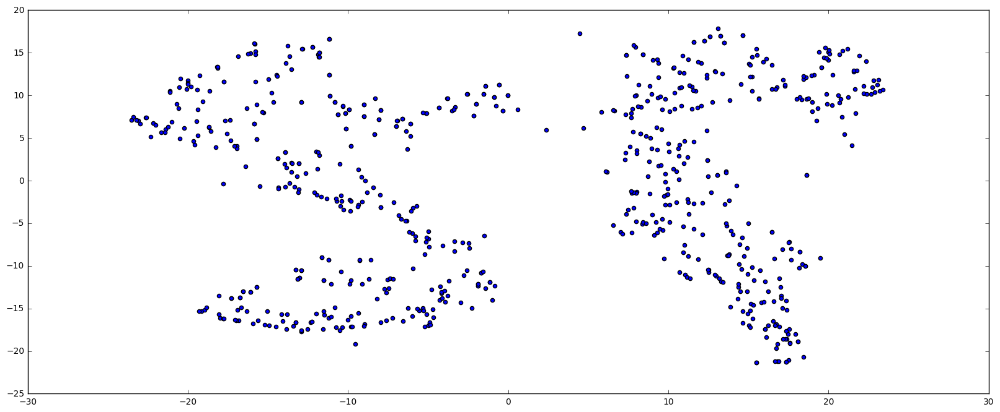

In [60]:
fig, ax = plt.subplots(1, 1, figsize = (20, 8))
ax.scatter(tsne2_fit[:,0], tsne2_fit[:,1])

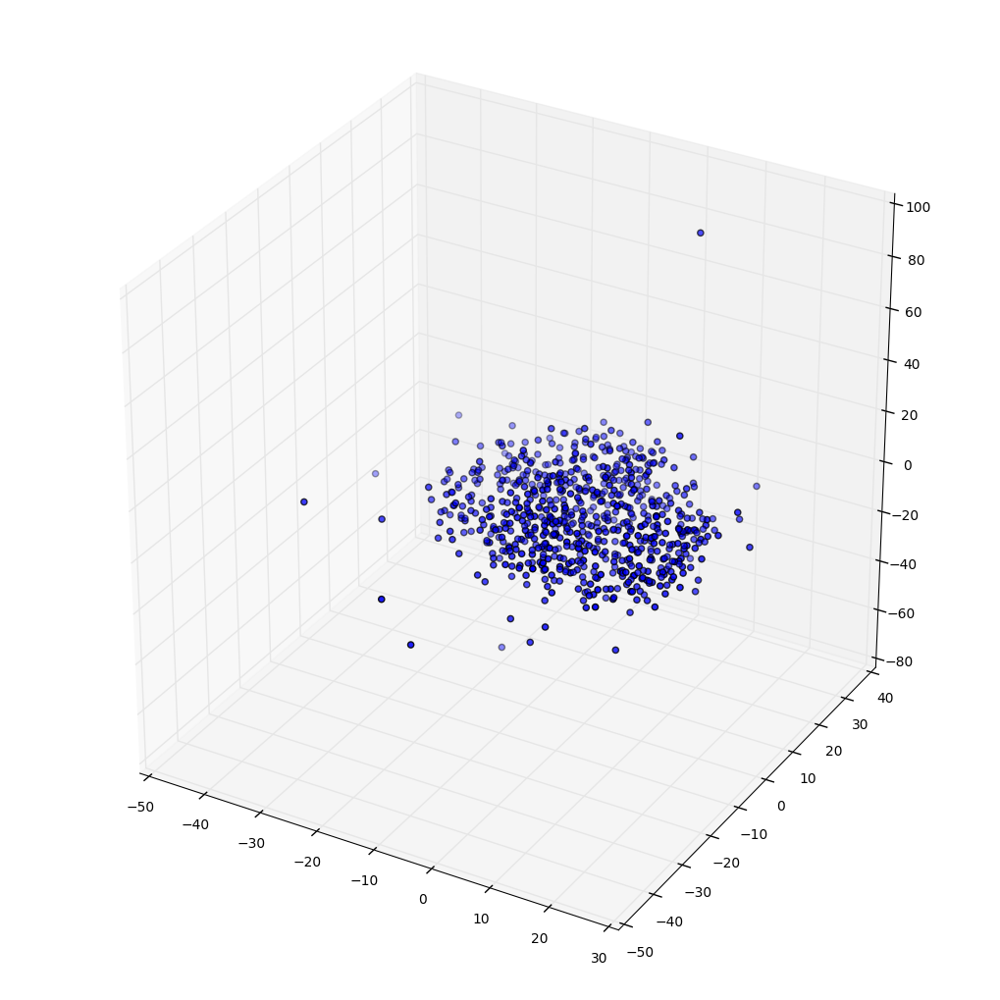

In [66]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize = (10, 10))
ax = Axes3D(fig)
ax.scatter(tsne3_fit[:,0], tsne3_fit[:,1], tsne3_fit[:,2]);

In [81]:
import sklearn.decomposition
pca = sklearn.decomposition.PCA()
pcafit = pca.fit(merged_noacts.ix[:, 3:])

In [82]:
print(pca.explained_variance_ratio_)

[ 0.56166122  0.19528375  0.09706695  0.03743033  0.0334655   0.02395576
  0.01635963  0.0119311   0.00604752  0.00502711  0.00301553  0.00233318
  0.00143782  0.00129806  0.00113203  0.00103861  0.00039539  0.00036251
  0.0002969   0.00023079  0.00015559  0.00003252  0.00001771  0.00000977
  0.00000837  0.00000437  0.0000007   0.00000056  0.00000036  0.00000027
  0.00000004  0.00000004  0.00000003  0.          0.          0.          0.        ]


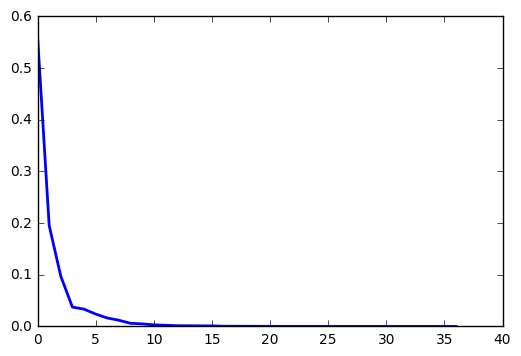

In [106]:
plt.plot(pca.explained_variance_ratio_, lw = 2);

In [132]:
Y = merged_noacts.sales.as_matrix()
X = merged_noacts.ix[:, 3:].as_matrix()
Xcols = merged_noacts.ix[:, 3:].columns.values

In [133]:
import sklearn.feature_selection
skb = sklearn.feature_selection.SelectKBest()
skbfit = skb.fit(X, Y)
colmask = skbfit.get_support()
print(X.shape, Y.shape)
print(colmask)
print(Xcols[colmask])
X_new = skb.fit_transform(X, Y)
print(X_new.shape)

(719, 37) (719,)
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False  True  True  True  True  True  True  True  True  True
  True]
['digicat_pricing_non_riders_prospecting'
 'digicat_pricing_non_riders_retargeting'
 'digicat_pricing_riders_retargeting'
 'digicat_promo_non_riders_prospecting'
 'digicat_promo_non_riders_retargeting' 'digicat_promo_riders_retargeting'
 'digicat_social_ads' 'digicat_social_video' 'digicat_video'
 'digicat_video_banner']
(719, 10)


In [139]:
import sklearn.feature_selection
vt = sklearn.feature_selection.VarianceThreshold(1e6)
vtfit = vt.fit(X, Y)
colmask = vtfit.get_support()
print(Xcols[colmask])

['sessions_count' 'newusers' 'transactions' 'revenue' 'ooh_cost'
 'social_buzz' 'search_clicks' 'search_branded_clicks' 'search_impressions'
 'search_branded_impressions' 'digicat_brand_non_riders'
 'digicat_brand_non_riders_prospecting'
 'digicat_brand_non_riders_retargeting' 'digicat_brand_riders'
 'digicat_brand_riders_retargeting' 'digicat_email' 'digicat_mobile'
 'digicat_native' 'digicat_pricing_non_riders_prospecting'
 'digicat_pricing_non_riders_retargeting'
 'digicat_pricing_riders_retargeting'
 'digicat_promo_non_riders_prospecting'
 'digicat_promo_non_riders_retargeting' 'digicat_promo_riders_retargeting'
 'digicat_social_video' 'digicat_video' 'digicat_video_banner']


In [140]:
import sklearn.feature_selection
fpr = sklearn.feature_selection.SelectFpr()
fprfit = fpr.fit(X, Y)
colmask = fprfit.get_support()
print(Xcols[colmask])

['sessions_count' 'newusers' 'transactions' 'revenue' 'gtrend' 'fuel_price'
 'djta' 'social_buzz' 'crash_buzz' 'badcrash_buzz' 'search_cost'
 'search_branded_cost' 'search_clicks' 'search_branded_clicks'
 'search_impressions' 'search_branded_impressions'
 'digicat_brand_non_riders' 'digicat_brand_non_riders_prospecting'
 'digicat_brand_non_riders_retargeting' 'digicat_brand_riders'
 'digicat_brand_riders_retargeting' 'digicat_email' 'digicat_mobile'
 'digicat_native' 'digicat_pricing_non_riders_prospecting'
 'digicat_pricing_non_riders_retargeting'
 'digicat_pricing_riders_retargeting'
 'digicat_promo_non_riders_prospecting'
 'digicat_promo_non_riders_retargeting' 'digicat_promo_riders_retargeting'
 'digicat_social_ads' 'digicat_social_video' 'digicat_video'
 'digicat_video_banner']


In [90]:
import sklearn.svm
svr = sklearn.svm.LinearSVR()
X = merged_noacts.ix[:, 3:].as_matrix().astype(float)
Y = merged_noacts.ix[:, 0].as_matrix().astype(float)
svr.fit(X, Y)

LinearSVR(C=1.0, dual=True, epsilon=0.0, fit_intercept=True,
     intercept_scaling=1.0, loss='epsilon_insensitive', max_iter=1000,
     random_state=None, tol=0.0001, verbose=0)

In [91]:
svr.score(X, Y)

0.070431291384595029

In [92]:
svr.get_params()

{'C': 1.0,
 'dual': True,
 'epsilon': 0.0,
 'fit_intercept': True,
 'intercept_scaling': 1.0,
 'loss': 'epsilon_insensitive',
 'max_iter': 1000,
 'random_state': None,
 'tol': 0.0001,
 'verbose': 0}

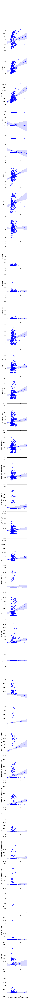

In [17]:
g = sns.PairGrid(merged_noacts, x_vars = ['sales'], y_vars = list(merged_noacts.columns[3:]), size = 4)
g.map_offdiag(sns.regplot)

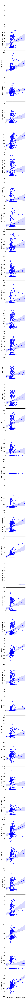

In [13]:
g = sns.PairGrid(merged_acts, x_vars = ['sales'], y_vars = list(merged_acts.columns[3:]), size = 4)
g.map_offdiag(sns.regplot)

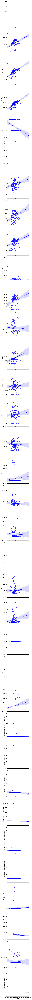

In [14]:
g = sns.PairGrid(merged_noacts['2016-01-01':], x_vars = ['sales'], y_vars = list(merged_noacts.columns[3:]), size = 4)
g.map_offdiag(sns.regplot)

---
## Poisson Regression Take 2...
---

In [18]:
modelstr = 'sales ~ ' + ' + '.join(merged_noacts.columns[3:])
pglm_noacts = pm.Model()
with pglm_noacts:
    pm.glm.glm(modelstr, merged_noacts, family = pm.glm.families.Poisson())
    step = pm.Metropolis()
    merged_noacts_ptrace = pm.sample(40000, step, progressbar = True)

Applied log-transform to mu and added transformed mu_log_ to model.
100%|██████████| 40000/40000 [14:12<00:00, 57.35it/s]


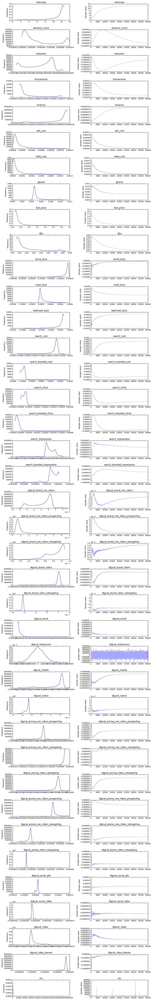

In [19]:
plt.figure(figsize=(32, 20))
pm.traceplot(merged_noacts_ptrace)
plt.tight_layout();

In [21]:
vardat = []
throwaway = 30000
for varname in merged_noacts_ptrace.varnames:
    vardat += [[varname, float(merged_noacts_ptrace.get_values(varname)[throwaway:].mean()), float(np.sqrt(merged_noacts_ptrace.get_values(varname)[throwaway:].var()))]]
merged_noacts_pfit = pd.DataFrame(vardat, columns = ['varname', 'beta', 'std_err']).sort_values('beta', ascending = False)
merged_noacts_pparams = merged_noacts_pfit.query('0.8 * abs(beta) > std_err')
merged_noacts_pparams = merged_noacts_pparams[~merged_noacts_pparams.varname.str.contains('Intercept|mu')]
merged_noacts_pparams.reset_index(drop = True).style.background_gradient(subset = 'beta', cmap = 'coolwarm', low = 0.9)